<p style="text-align:center;">
<img src="https://github.com/digital-futures-academy/DataScienceMasterResources/blob/main/Resources/datascience-notebook-header.png?raw=true"
     alt="DigitalFuturesLogo"
     style="float: center; margin-right: 10px;" />
</p>

# World Health Organisation Exploratory Data Analysis
### <i>By Team Dr WHO</i>

### Table Of Contents:
* [General Properties](#1)
* [Train-test-split](#2)
* [Data Cleaning](#3)
* [Exploratory Data Analysis](#4)

The aim of this workbook is to perform Exploratory Data Analysis on the WHO dataset.

In [3]:
# Import Libraries

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [4]:
# Read in dataset
df = pd.read_csv("Life Expectancy Data.csv")

## General properties <a class="anchor" id="1"></a>

In [214]:
# check first row
pd.options.display.max_columns = None
df.head(1)

,Country,Region,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,Polio,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
0,Turkiye,Middle East,2015,11.1,13.0,105.824,1.32,97,65,27.8,97,97,0.08,11006,78.53,4.9,4.8,7.8,0,1,76.5


In [216]:
# check shape
df.shape

(2864, 21)

In [218]:
# check columns
df.columns

Index(['Country', 'Region', 'Year', 'Infant_deaths', 'Under_five_deaths',
       'Adult_mortality', 'Alcohol_consumption', 'Hepatitis_B', 'Measles',
       'BMI', 'Polio', 'Diphtheria', 'Incidents_HIV', 'GDP_per_capita',
       'Population_mln', 'Thinness_ten_nineteen_years',
       'Thinness_five_nine_years', 'Schooling', 'Economy_status_Developed',
       'Economy_status_Developing', 'Life_expectancy'],
      dtype='object')

In [220]:
# check data types
df.dtypes

Country                         object
Region                          object
Year                             int64
Infant_deaths                  float64
Under_five_deaths              float64
Adult_mortality                float64
Alcohol_consumption            float64
Hepatitis_B                      int64
Measles                          int64
BMI                            float64
Polio                            int64
Diphtheria                       int64
Incidents_HIV                  float64
GDP_per_capita                   int64
Population_mln                 float64
Thinness_ten_nineteen_years    float64
Thinness_five_nine_years       float64
Schooling                      float64
Economy_status_Developed         int64
Economy_status_Developing        int64
Life_expectancy                float64
dtype: object

## Train-test-split <a class="anchor" id="2"></a>

Train-test-splitting is performed on the dataset before any further exploration. The training data will be 80% of the dataset, and the testing data the remaining 20%.

In [7]:
# The feature columns
feature_cols = list(df.columns)
feature_cols.remove("Life_expectancy")

In [9]:
# Seperate the features from the target
X = df[feature_cols] # Feature dataframe
y = df.Life_expectancy # Target Series

In [11]:
#Train test split
X_train, X_test, y_train, y_test = train_test_split(X, # Features
                                                    y, # Target
                                                    test_size = 0.2, # % test sample
                                                    random_state = 1 # gives the same split even if rerun
                                                   )

In [13]:
# check shape
X_train.shape

(2291, 20)

In [15]:
# check X_train and y_train indexes match
all(X_train.index == y_train.index )

True

## Data Cleaning <a class="anchor" id="3"></a>

### Initial Cleaning of Train Data

In [17]:
# join X_train and y_train, and X_test and y_test
train_df = X_train.join(y_train)
test_df = X_test.join(y_test)

In [19]:
# check shape of train_df
train_df.shape

(2291, 21)

In [21]:
# check first few rows of train_df
train_df.head()

,Country,Region,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,...,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
2291,United Arab Emirates,Middle East,2001,9.3,10.9,95.5935,1.62,92,92,27.2,...,94,0.13,58422,3.30,5.3,5.1,8.4,0,1,74.5
1188,Spain,European Union,2008,3.4,4.2,70.1140,10.24,97,94,26.2,...,97,0.09,27026,45.95,0.6,0.5,9.2,1,0,81.2
772,Sao Tome and Principe,Central America and Caribbean,2002,48.0,71.0,217.4790,5.93,70,71,23.7,...,92,1.08,1087,0.15,7.6,7.6,4.3,0,1,62.7
1336,Portugal,European Union,2002,4.7,6.1,106.0975,12.50,82,64,25.6,...,98,0.21,19068,10.42,0.8,0.6,7.0,1,0,77.1
429,Poland,European Union,2010,5.1,6.0,129.3125,10.07,98,94,26.1,...,99,0.08,10859,38.04,2.1,2.2,12.2,1,0,76.2


In [23]:
# check for nulls per column
train_df.isnull().sum()

Country                        0
Region                         0
Year                           0
Infant_deaths                  0
Under_five_deaths              0
Adult_mortality                0
Alcohol_consumption            0
Hepatitis_B                    0
Measles                        0
BMI                            0
Polio                          0
Diphtheria                     0
Incidents_HIV                  0
GDP_per_capita                 0
Population_mln                 0
Thinness_ten_nineteen_years    0
Thinness_five_nine_years       0
Schooling                      0
Economy_status_Developed       0
Economy_status_Developing      0
Life_expectancy                0
dtype: int64

In [25]:
# check for duplicated rows
sum(train_df.duplicated())

0

In [27]:
# check unique values
train_df.nunique()

Country                         179
Region                            9
Year                             16
Infant_deaths                   779
Under_five_deaths               934
Adult_mortality                2280
Alcohol_consumption            1049
Hepatitis_B                      76
Measles                          86
BMI                             117
Polio                            76
Diphtheria                       79
Incidents_HIV                   350
GDP_per_capita                 2080
Population_mln                 1530
Thinness_ten_nineteen_years     192
Thinness_five_nine_years        196
Schooling                       129
Economy_status_Developed          2
Economy_status_Developing         2
Life_expectancy                 393
dtype: int64

><b>Insights:</b>\
    * There are 179 countries and 9 regions in the training dataset.\
    * There are no nulls or duplicated rows in the training dataset.

### Cleaning Checks on Test Data

In [29]:
# function to check for any nulls or duplicate rows
def check_clean(df):
    
    # returns true if there are any nulls in the dataframe
    has_nulls = df.isnull().values.any()
    
    # duplicates is false if there are no duplicated rows, true otherwise
    if sum(df.duplicated()) == 0:
        duplicates = False
    else:
        duplicates = True
        
    return has_nulls, duplicates

In [31]:
check_clean(test_df)

(False, False)

><b>Insights:</b>\
    * There are no nulls or duplicated rows in the testing dataset.\
    * No further action is required on the testing set in this EDA workbook.

## Exploratory Data Analysis  <a class="anchor" id="4"></a>

### Summary Statistics

First, check the summary statistics to get a feel of the dataset.

In [262]:
# Check summary statistics
train_df.describe()

,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,Polio,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
count,2291.000000,2291.000000,2291.000000,2291.000000,2291.000000,2291.000000,2291.000000,2291.000000,2291.000000,2291.000000,2291.000000,2291.000000,2291.00000,2291.000000,2291.000000,2291.000000,2291.000000,2291.000000,2291.000000
mean,2007.450022,30.482933,42.976910,192.291228,4.826151,84.350502,77.527717,25.051113,86.527281,86.253601,0.914588,11493.591445,36.53900,4.829027,4.892449,7.637320,0.205151,0.794849,68.852248
std,4.654388,27.815476,44.776425,115.246120,3.989247,16.078459,18.641422,2.186557,15.164701,15.659472,2.459888,16900.130926,136.96815,4.430364,4.540586,3.170865,0.403900,0.403900,9.424849
min,2000.000000,1.800000,2.300000,49.998000,0.000000,14.000000,12.000000,19.800000,8.000000,16.000000,0.010000,148.000000,0.08000,0.100000,0.100000,1.100000,0.000000,0.000000,39.400000
25%,2003.000000,8.150000,9.700000,106.374250,1.205000,79.000000,64.000000,23.300000,82.000000,81.000000,0.080000,1422.500000,2.06500,1.600000,1.600000,5.000000,0.000000,1.000000,62.900000
50%,2007.000000,19.500000,22.900000,163.946000,3.990000,89.000000,83.000000,25.600000,93.000000,93.000000,0.150000,4221.000000,7.55000,3.300000,3.300000,7.800000,0.000000,1.000000,71.300000
75%,2012.000000,47.800000,65.950000,246.226000,7.825000,96.000000,93.000000,26.500000,97.000000,97.000000,0.430000,12628.500000,23.56000,7.200000,7.300000,10.300000,0.000000,1.000000,75.500000
max,2015.000000,138.100000,224.900000,719.360500,17.750000,99.000000,99.000000,32.100000,99.000000,99.000000,21.680000,112418.000000,1379.86000,27.700000,28.600000,14.100000,1.000000,1.000000,83.800000


><b>Insights</b>:\
    * The dataset contains data from between 2000 and 2015.\
    * The minimum and maximum values for each column look reasonable.\
    * Country and Region are not in numerical format.\
    * Economy Status is effectively already one-hot encoded.

### Life Expectancy Trends

#### Life Expectancy Over the Years

C:\Users\sumye\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\sumye\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


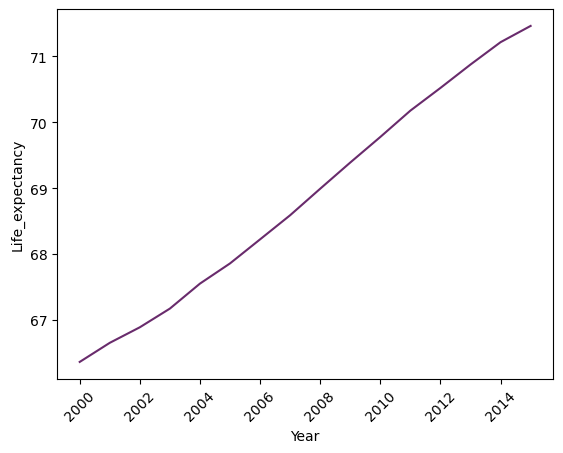

In [159]:
plt.xticks(rotation=45)
sns.lineplot(data=df.groupby("Year").Life_expectancy.mean(), color='#692b6c')
plt.show()

><b>Insights</b>:\
    * Life expectancy on average has increased over the years.

#### Life Expectancy by Region

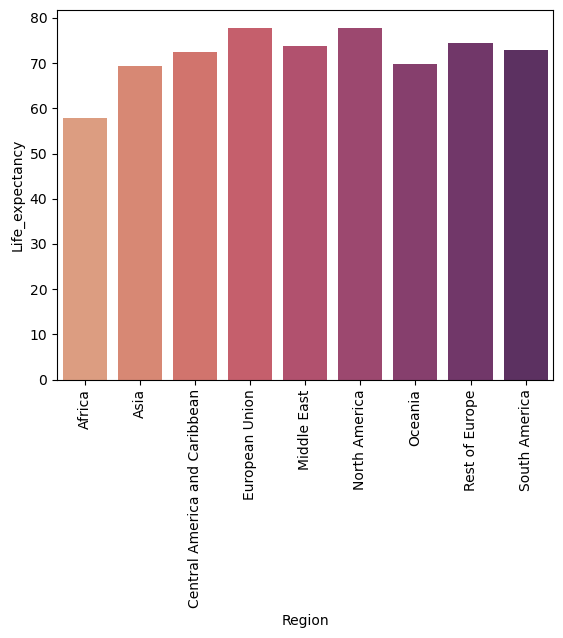

In [81]:
# show average life expectancy by region
region_life_expectancy = train_df.groupby('Region')['Life_expectancy'].mean().reset_index()
sns.barplot(data=region_life_expectancy, x='Region', y='Life_expectancy', palette='flare')
plt.xticks(rotation=90)
plt.show()

><b>Insights</b>:\
    * Average life expectancy is highest in the European Union and North America.\
    * Africa has the lowest average life expectancy.

Do a quick check on the regions included in the database, and what countries are listed under what region.

In [268]:
# check countries listed under Region
for rgn in list(train_df.Region.unique()):
    print(f"{rgn}:")
    print(', '.join(list(train_df[train_df.Region == rgn].Country.unique())))
    print("\n")

Middle East:
United Arab Emirates, Turkiye, Oman, Saudi Arabia, Lebanon, Iran, Islamic Rep., Kuwait, Syrian Arab Republic, Yemen, Rep., Israel, Bahrain, Iraq, Jordan, Qatar


European Union:
Spain, Portugal, Poland, Bulgaria, Malta, Denmark, Austria, Estonia, Belgium, Greece, Ireland, Luxembourg, Lithuania, Cyprus, Slovenia, Latvia, Slovak Republic, Romania, France, Italy, Czechia, Hungary, Netherlands, Finland, Sweden, Germany, Croatia


Central America and Caribbean:
Sao Tome and Principe, Haiti, Nicaragua, St. Lucia, Costa Rica, Dominican Republic, Antigua and Barbuda, Barbados, Bahamas, The, Grenada, Panama, Belize, Jamaica, El Salvador, Trinidad and Tobago, Cuba, Honduras, Guatemala, St. Vincent and the Grenadines


Asia:
Lao PDR, Tajikistan, Myanmar, Philippines, Malaysia, Nepal, Afghanistan, Maldives, Cambodia, Uzbekistan, Turkmenistan, Kazakhstan, Thailand, Bangladesh, Pakistan, Japan, Azerbaijan, Kyrgyz Republic, China, Singapore, Sri Lanka, Vietnam, Mongolia, India, Bhutan, B

><b>Insights</b>:\
    * The countries are listed under the correct region.

To find what might impact life expectancy, correlation in the dataset was studied.

### Correlation

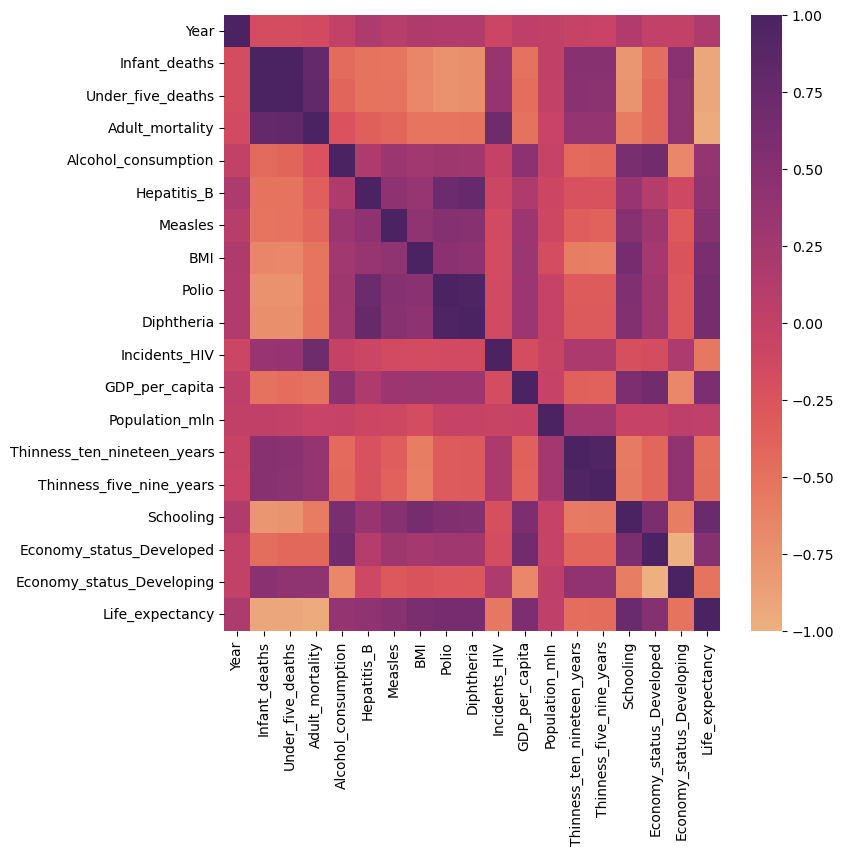

In [ ]:
# Visulise correlation matrix as heatmap
plt.figure(figsize = (8, 8))
sns.heatmap(train_df.corr(numeric_only=True), 
            #annot = True,
            #fmt = '0.2',
            cmap = 'flare',
            #mask = np.triu(cm)
           )    

plt.show()

# annotations not working properly so have been left out

><b>Insights</b>:\
    * Life expectancy has a strong positive correlation with BMI, and Polio and Diptheria vaccination coverage, as well as Schooling.\
    * Life expectancy has a strong negative correlation with Infant Deaths, Under Five Deaths, and Adult Mortality.

C:\Users\sumye\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\sumye\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\sumye\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\sumye\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

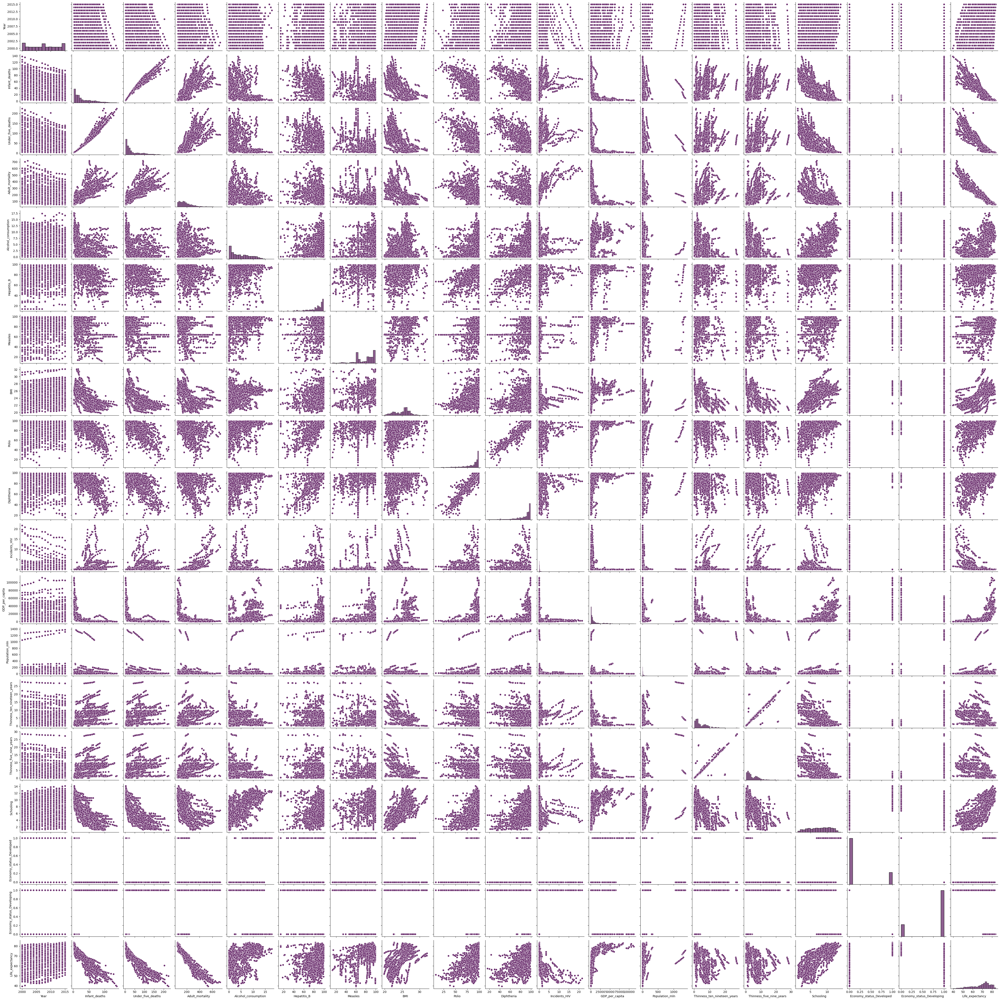

In [99]:
sns.pairplot(train_df, plot_kws={'color': '#692b6c'}, diag_kws={'color': '#692b6c'})

><b>Insights</b>:\
    * Infant Deaths and Under Five Deaths are strongly correlated.\
    * Thinness between 5-9 and Thiness between 10-19 are strongly correlated.\
    * Polio and Diptheria vaccination coverage are strongly correlated.\
    * The mortality variables are correlated with vaccination coverage.

The correlation graphs for life expectancy are shown at a larger scale below.

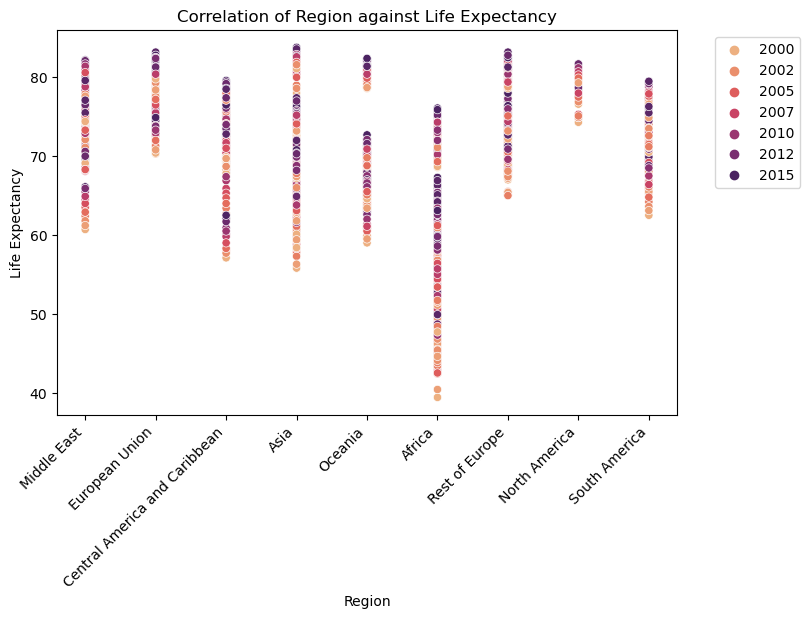

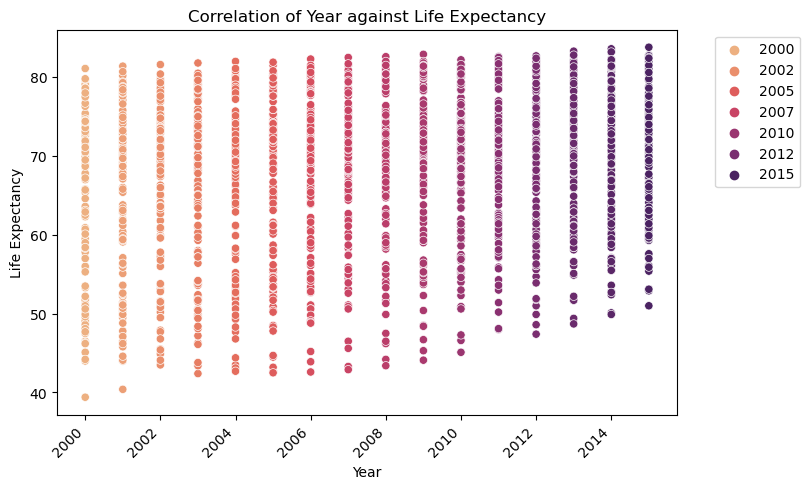

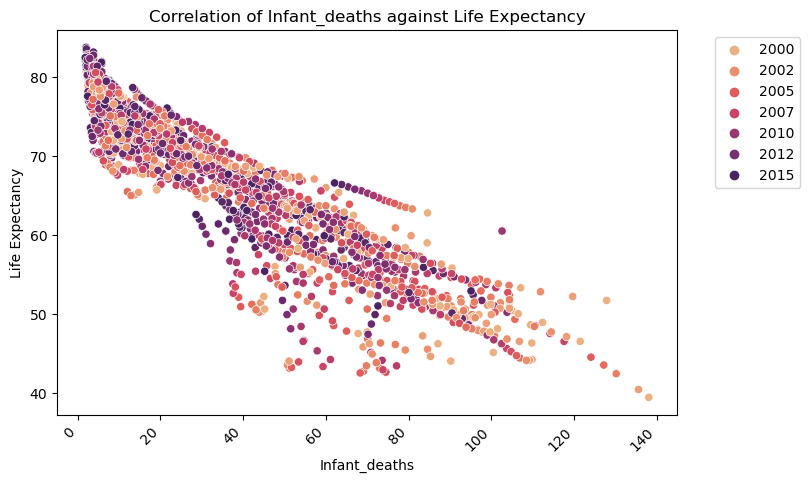

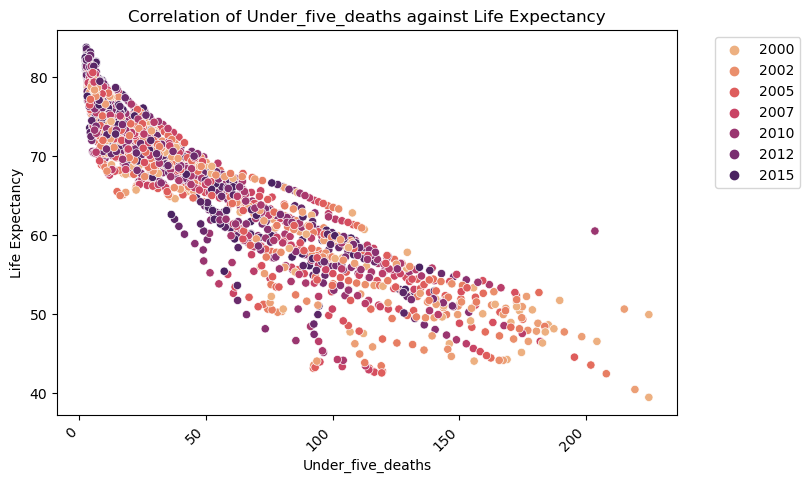

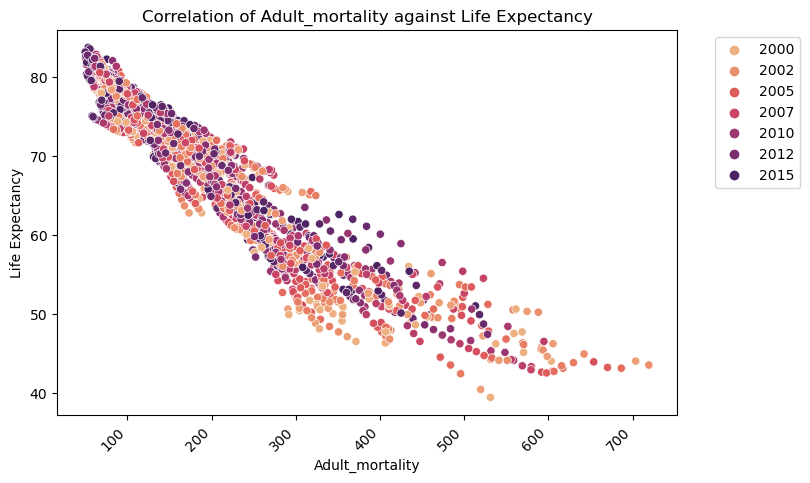

...

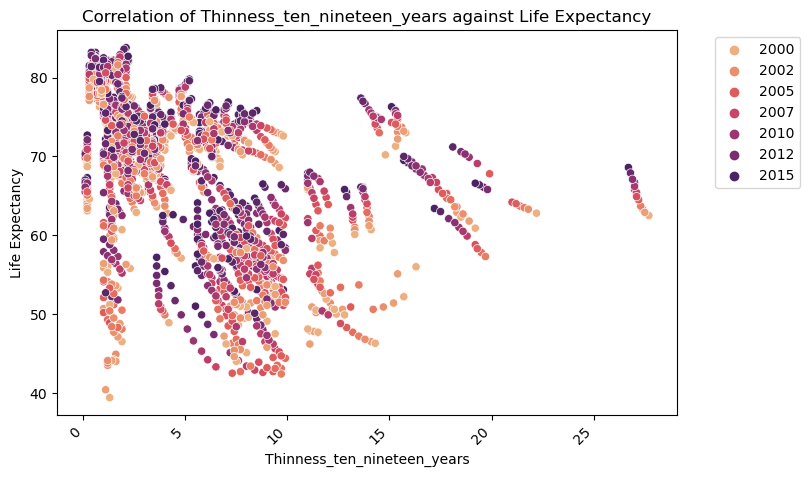

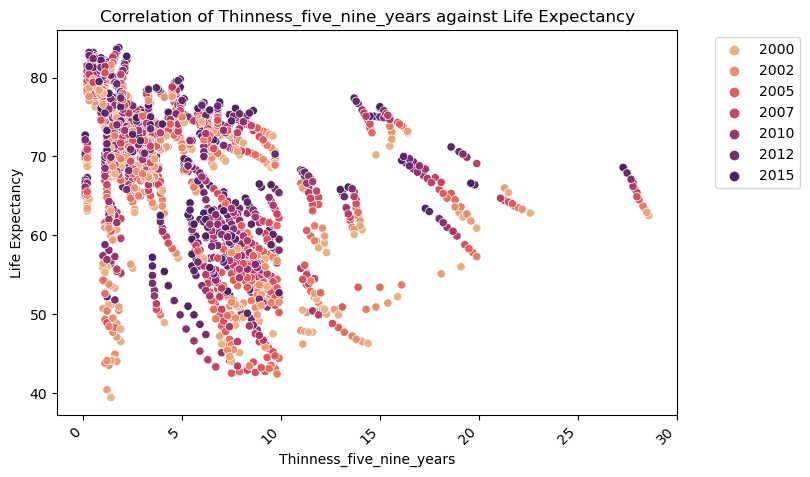

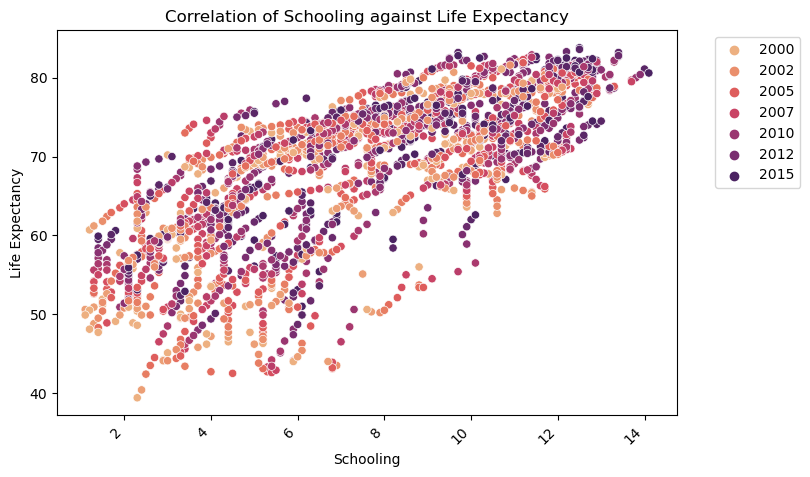

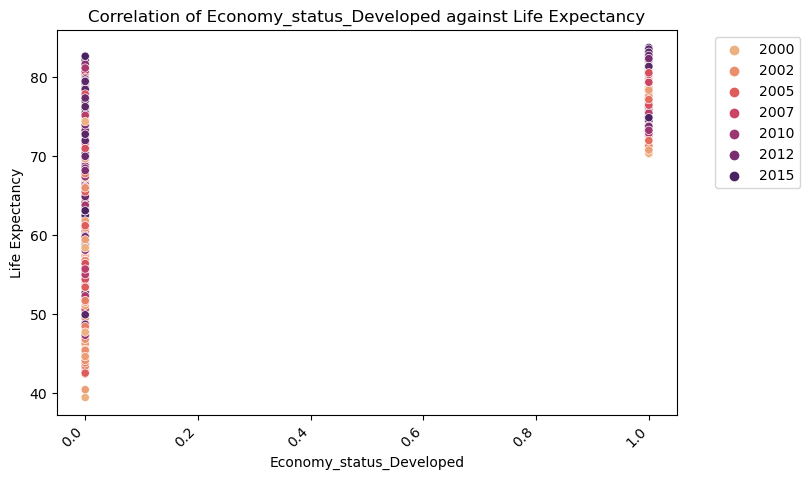

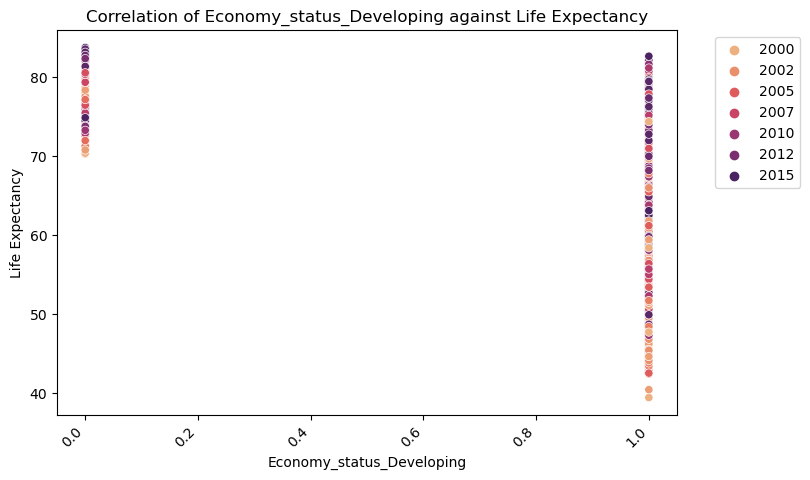

In [37]:
# show correlation graphs for each variable against life expectancy

# leave out country and life expectancy columns
for my_column in train_df.columns[1:-1]:
    plt.figure(figsize=(8, 5))
    # create scatterplot
    sns.scatterplot(x=my_column, 
                  y="Life_expectancy",
                  hue="Year", 
                  data=train_df,
                   palette = 'flare')
    
    plt.title(f'Correlation of {my_column} against Life Expectancy')
    plt.xlabel(my_column)
    plt.ylabel('Life Expectancy')
    plt.xticks(rotation = 45,
              horizontalalignment = 'right')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    #plt.grid()  # adds grid --> looks messy for the first graph
    plt.show()

><b>Insights</b>:\
    * Life expectancy seems to have a linear relationship with Infant Deaths, Under Five Deaths, Adult Mortality, and Schooling.\
    * Infant Deaths, Under Five Deaths, Adult Mortality, and Incidents of HIV seem to decrease over the years, whilst Schooling and Population increase.\
    * GDP per Capita may have an exponential relationship with life expectancy.\
    * GDP per Capita is on a scale much larger than the rest of the variables.

### Outliers

#### Global

The below graphs look for outliers in the data.

C:\Users\sumye\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\sumye\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\sumye\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\sumye\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

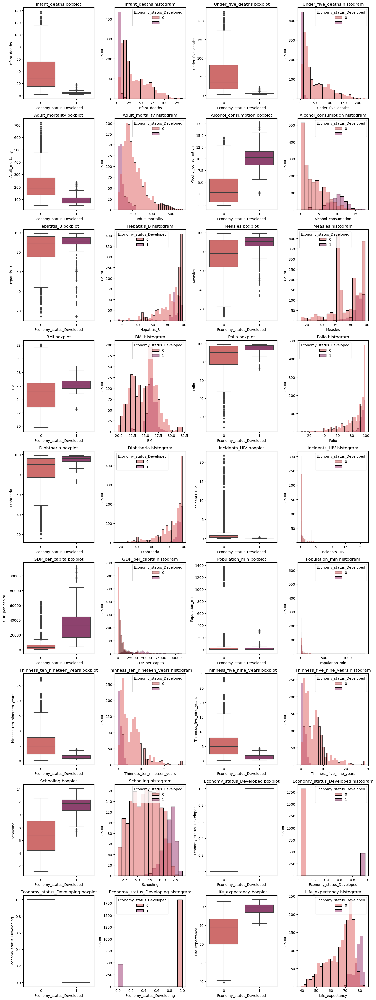

In [93]:
# code adapted from https://www.kaggle.com/code/philbowman212/life-expectancy-exploratory-data-analysis with help from
# https://seaborn.pydata.org/generated/seaborn.boxplot.html

# create a list of columns we are interested in
cont_vars = list(train_df.columns)[3:]

def outliers_visual(data):
    plt.figure(figsize=(15, 40))
    i = 0
    
    # for each column in the list
    for col in cont_vars:
        
        # graph number starts at 1
        i += 1
        # 9 rows, 4 columns, graph number i
        plt.subplot(9, 4, i)
        # create a boxplot with developed and developing countries shown in different colours for each column in the list
        sns.boxplot(x='Economy_status_Developed', y=col, data=data, palette='flare')
        plt.title('{} boxplot'.format(col))
        
        # graph number increases
        i += 1
        # 9 rows, 4 columns, graph number i
        plt.subplot(9, 4, i)
        # create a histogram with developed and developing countries shown in different colours for each column in the list
        sns.histplot(data=data, x=col, hue='Economy_status_Developed', palette='flare')
        plt.title('{} histogram'.format(col))
    
    # adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

    
outliers_visual(train_df)

According to the boxplots there a quite a few outliers, however these are outliers for the global data as a whole. The data is checked for outliers within each country below.

#### By Country

In [95]:
# create a list of columns we are interested in
cont_vars = list(train_df.columns)[3:]

def outliers_visual(data):
    plt.figure(figsize=(35, 200))
    i = 0
    
    # for each column in the list
    for col in cont_vars:
        
        # graph number starts at 1
        i += 1
        # 9 rows, 4 columns, graph number i
        plt.subplot(18, 1, i)
        # create a boxplot with developed and developing countries shown in different colours for each column in the list
        sns.boxplot(x='Country', y=col, data=data, palette='flare')
        plt.title('{} boxplot'.format(col), fontsize=12)
        
        plt.xticks(rotation=90,
           horizontalalignment='center',
           fontweight ='light',
           fontsize =12
           )
        plt.xlabel('')
        plt.grid(True)

    # adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

    
outliers_visual(train_df)

><b>Insights</b>:\
    * Just scanning over the graphs, there are much fewer outliers than previously suggested.\
    * Much of the outliers occur for the vaccination coverage variables, including Hepatitis B, Measles, Polio, and Diptheria coverage. This may mean that these variables will not be as useful as others in the predictive model.